In [732]:
import numpy as np
import pandas as pd
from shutil import copyfile
# from astropy.cosmology import Planck13 as cosmo
from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=70, Om0=0.3)
from astropy.cosmology import z_at_value
import fsps
from matplotlib import gridspec
import matplotlib as mpl
from astropy.io import fits
from astropy import wcs
from astropy.table import Table
import astropy.units as u
from sim_engine import Scale_model
from spec_tools import Source_present, Oldest_galaxy, Sig_int, Smooth, Rescale_sfh, \
    lbt_to_z, boot_to_posterior, age_to_z, Posterior_spec
from spec_stats import Smooth, Highest_density_region, Linear_fit
from spec_id import *
from spec_id_2d import Gen_temp_dict_addline
from spec_stats import Highest_density_region, Linear_fit
from spec_exam import Gen_spec
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d, interp2d
from glob import glob
import seaborn as sea
import os
from grizli import multifit
from grizli import model
from grizli.utils import SpectrumTemplate
from sim_engine import forward_model_grism

from bokeh.models import HoverTool, ColumnDataSource, OpenURL, TapTool, DataTable, TableColumn, \
    Label, BoxAnnotation, Band
from bokeh import palettes
from bokeh.plotting import figure,save
from bokeh.io import show, output_notebook, output_file
from bokeh.transform import linear_cmap
from bokeh.layouts import gridplot

import pickle
from spec_tools import Gen_SFH

from time import time
sea.set(style='white')
sea.set(style='ticks')
sea.set_style({'xtick.direct'
               'ion': 'in','xtick.top':True,'xtick.minor.visible': True,
               'ytick.direction': "in",'ytick.right': True,'ytick.minor.visible': True})
cmap = sea.cubehelix_palette(12, start=2, rot=.2, dark=0, light=1.0, as_cmap=True)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

### set home for files
hpath = os.environ['HOME'] + '/'

if hpath == '/Users/Vince.ec/':
    dpath = '/Volumes/Vince_research/Data/' 
    
else:
    dpath = hpath + 'Data/' 

In [657]:
alldb = pd.read_pickle('../dataframes/fitdb/allfits_1D.pkl')
sfdb = pd.read_pickle('../dataframes/fitdb/SFfits_1D.pkl')

inout = []
for i in alldb.index:
    IO = 'i'
    if alldb.field[i] == 'GND' and alldb.id[i] in sfdb.query('field == "GND"').id.values:
        IO = 'o' 
    if alldb.field[i] == 'GSD' and alldb.id[i] in sfdb.query('field == "GSD"').id.values:
        IO = 'o' 
    inout.append(IO)
    
alldb['inout'] = inout

Qdb = alldb.query('inout == "i" and t_50 > 0')

adb = pd.concat([Qdb, sfdb])
adb = adb.reset_index()
adb = adb.drop(columns='index')
Adb = adb.query('AGN != "AGN" and lmass > 10 and 0.7 < zgrism < 2.5')

from scipy.optimize import curve_fit

def gauss(x,mu,sigma,A):
    return A*np.exp(-(x-mu)**2/2/sigma**2)

def bimodal(x,mu1,sigma1,A1,mu2,sigma2,A2):
    return gauss(x,mu1,sigma1,A1)+gauss(x,mu2,sigma2,A2)

y,x=np.histogram(Adb.log_ssfr.values,100)

x=(x[1:]+x[:-1])/2 # for len(x)==len(y)

expected=(-12, 0.45, 12,-9.56, 0.649,25)
params,cov=curve_fit(bimodal,x,y,expected)
sigma=np.sqrt(np.diag(cov))

X = np.linspace(-14, -7, 10000)
Qdist = gauss(X,-11.53617247, 0.65205167, 11.39604618)
SFdist = gauss(X,  -9.41418374, 0.59120587, 26.03851874)

Qint = []
Sint = []
for i in range(len(X)):
    Qint.append(np.trapz(Qdist[i:i+2],X[i:i+2]))
    Sint.append(np.trapz(SFdist[i:i+2],X[i:i+2]))    

Fint = np.add(Qint, Sint)

SFprob = interp1d(X,Sint / Fint)

t_q = []
lSig = []
lRe = []
lZ = []
z50 = []
concen = []
SFR = []
sfprob = []
for i in adb.index:
    if adb.zgrism[i] < 0:
        adb.zgrism[i] = adb.zfit[i]

    if adb.sSFR_avg[i] > 0:
        adb.log_ssfr[i] = adb.sSFR_avg[i]
     
    t_q.append(adb.t_50[i] - adb.t_90[i])
    lSig.append(np.log10(adb.Sigma1[i]))
    lRe.append(np.log10(adb.Re[i]))
    lZ.append(np.log10(adb.Z[i]))
    z50.append(cosmo.lookback_time(adb.z_50[i]).value)
    concen.append(np.log10(adb.Sigma1[i] / (10**adb.lmass[i])))
    SFR.append(np.log10(10**adb.log_ssfr[i] * 10**adb.lmass[i]))
    sfprob.append(float(SFprob(adb.log_ssfr[i])))
    
adb['t_q'] = t_q
adb['log_Sigma1'] = lSig
adb['log_Re'] = lRe
adb['log_Z'] = lZ
adb['z50'] = z50
adb['concen'] = concen
adb['log_sfr'] = SFR
adb['sf_prob'] = sfprob
  
Adb = adb.query('AGN != "AGN" and lmass > 10 and concen < -0.4 and 0.7 < zgrism < 2.5')
Axdb = adb.query('AGN == "AGN" and lmass > 10 and concen < -0.4 and 0.7 < zgrism < 2.5')

qdb = Adb.query('log_ssfr < -11 and AGN != "AGN" and n_f < 3 and  -2.4 < concen < -0.5')
sfdb = Adb.query('log_ssfr > -11 and AGN != "AGN" and n_f < 3 and  -2.4 < concen < -0.5')
xqdb = adb.query('log_ssfr < -11 and AGN == "AGN" and n_f < 3 and  -2.4 < concen < -0.5')
xsdb = adb.query('log_ssfr > -11 and AGN == "AGN" and n_f < 3 and -2.4 < concen < -0.5')

/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:50: RuntimeWarning: invalid value encountered in true_divide
/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [239]:
v4N = Table.read(fits.open('/Volumes/Vince_CLEAR/3dhst_V4.4/goodsn_3dhst.v4.4.cats/Eazy/goodsn_3dhst.v4.4.zout.fits'),
                 format='fits').to_pandas()
v4S = Table.read(fits.open('/Volumes/Vince_CLEAR/3dhst_V4.4/goodss_3dhst.v4.4.cats/Eazy/goodss_3dhst.v4.4.zout.fits'),
                 format='fits').to_pandas()

v4Ncat = Table.read('/Volumes/Vince_CLEAR/3dhst_V4.4/goodsn_3dhst.v4.4.cats/Catalog/goodsn_3dhst.v4.4.cat',
                 format='ascii').to_pandas()
v4Scat = Table.read('/Volumes/Vince_CLEAR/3dhst_V4.4/goodss_3dhst.v4.4.cats/Catalog/goodss_3dhst.v4.4.cat',
                 format='ascii').to_pandas()

v4N['use'] = v4Ncat['use_phot']
v4S['use'] = v4Scat['use_phot']

v4N['star'] = v4Ncat['class_star']
v4S['star'] = v4Scat['class_star']

v4N['f125'] = v4Ncat['f_F125W']
v4S['f125'] = v4Scat['f_F125W']

v4N['f160'] = v4Ncat['f_F160W']
v4S['f160'] = v4Scat['f_F160W']

filesN = glob('/Volumes/Vince_CLEAR/RELEASE_v2.1.0/*N*/*.1D.fits')
filesS = glob('/Volumes/Vince_CLEAR/RELEASE_v2.1.0/*S*/*.1D.fits')

allNids = [int(os.path.basename(U).replace('.1D.fits','').split('_')[1]) for U in filesN]
allSids = [int(os.path.basename(U).replace('.1D.fits','').split('_')[1]) for U in filesS]

Nids = np.array(list(set(allNids)))
Sids = np.array(list(set(allSids)))

Npresent = [U in Nids for U in v4N.id]
Spresent = [U in Sids for U in v4S.id]

v4N['grism'] = Npresent
v4S['grism'] = Spresent

def Color(band1, band2):
    m1=-2.5*np.log10(band1)
    m2=-2.5*np.log10(band2)
    return m1-m2

UV = []
VJ = []

for i in Adb.index:
    if Adb.field[i] == 'GND':
        UV.append(Color(v4N.query('id == {}'.format(Adb.id[i])).restU.values[0], v4N.query('id == {}'.format(Adb.id[i])).restV.values[0]))
        VJ.append(Color(v4N.query('id == {}'.format(Adb.id[i])).restV.values[0], v4N.query('id == {}'.format(Adb.id[i])).restJ.values[0])) 
        
    if Adb.field[i] == 'GSD':
        UV.append(Color(v4S.query('id == {}'.format(Adb.id[i])).restU.values[0], v4S.query('id == {}'.format(Adb.id[i])).restV.values[0]))
        VJ.append(Color(v4S.query('id == {}'.format(Adb.id[i])).restV.values[0], v4S.query('id == {}'.format(Adb.id[i])).restJ.values[0])) 

Adb['VJ'] = VJ
Adb['UV'] = UV

No handles with labels found to put in legend.


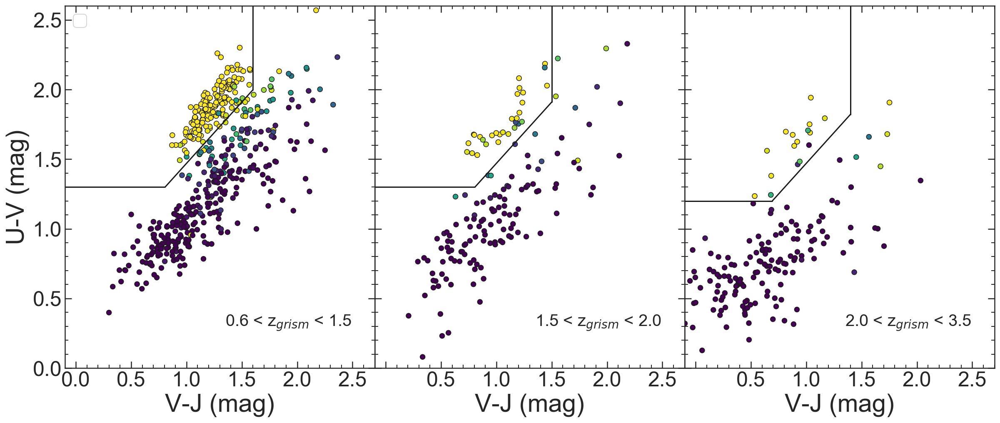

In [254]:
UVy = np.linspace(0,2.5)
VJx = np.linspace(-1,2.5)

iUVJ = interp1d(VJx, 0.88 * VJx +0.59)
invUVJ = interp1d(0.88 * VJx +0.59, VJx)

gs = gridspec.GridSpec(1,3, wspace=0)

plt.figure(figsize = [20, 8])

ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])

ax1.plot([-1,invUVJ(1.3)],[1.3,1.3], color = 'k')
ax1.plot([1.6,1.6],[iUVJ(1.6),2.7], color = 'k')
ax1.plot([invUVJ(1.3),1.6],[1.3,iUVJ(1.6)], color = 'k')
sea.scatterplot(Adb.query('zgrism < 1.5').VJ, Adb.query('zgrism < 1.5').UV.values, 
                hue = Adb.query('zgrism < 1.5').sf_prob.values, legend = False, ax = ax1, palette='viridis_r', edgecolor = 'k')


######################################
ax2.plot([-1,invUVJ(1.3)],[1.3,1.3], color = 'k')
ax2.plot([1.5,1.5],[iUVJ(1.5),2.7], color = 'k')
ax2.plot([invUVJ(1.3),1.5],[1.3,iUVJ(1.5)], color = 'k')
sea.scatterplot(Adb.query('1.5 < zgrism < 2.0').VJ, Adb.query('1.5 < zgrism < 2.0').UV.values, 
                hue = Adb.query('1.5 < zgrism < 2.0').sf_prob.values, legend = False, ax = ax2, palette='viridis_r', edgecolor = 'k')

############################################
ax3.plot([-1,invUVJ(1.2)],[1.2,1.2], color = 'k')
ax3.plot([1.4,1.4],[iUVJ(1.4),2.7], color = 'k')
ax3.plot([invUVJ(1.2),1.4],[1.2,iUVJ(1.4)], color = 'k')
sea.scatterplot(Adb.query('2.0 < zgrism < 3.5').VJ, Adb.query('2.0 < zgrism < 3.5').UV.values, 
                hue = Adb.query('2.0 < zgrism < 3.5').sf_prob.values, legend = False, ax = ax3, palette='viridis_r', edgecolor = 'k')

ax1.set_xlabel('V-J (mag)', fontsize=30)
ax2.set_xlabel('V-J (mag)', fontsize=30)
ax3.set_xlabel('V-J (mag)', fontsize=30)

ax1.set_ylabel('U-V (mag)', fontsize=30)

ax1.set_xticks(np.arange(0,3,0.5))
ax1.set_xticklabels(np.arange(0,3,0.5))
ax2.set_xticks(np.arange(0,3,0.5))
ax2.set_xticklabels(['',0.5,1.0,1.5,2.0,2.5])
ax3.set_xticks(np.arange(0,3,0.5))
ax3.set_xticklabels(['',0.5,1.0,1.5,2.0,2.5])

ax2.set_yticks([0,0.5,1.0,1.5,2.0])
ax2.set_yticklabels([])

ax3.set_yticks([0,0.5,1.0,1.5,2.0])
ax3.set_yticklabels([])

ax1.minorticks_on()
ax2.minorticks_on()
ax3.minorticks_on()

ax1.tick_params(axis='both', which='major', labelsize=25, length = 8)
ax2.tick_params(axis='both', which='major', labelsize=25, length = 8)
ax3.tick_params(axis='both', which='major', labelsize=25, length = 8)

ax1.text(1.35, 0.3, '0.6 < z$_{grism}$ < 1.5', fontsize =20)
# ax1.text(1.1, 0.1, 'log(M$_*$/M$_\odot$)$_{phot}$ > 10.0', fontsize =20)

ax2.text(1.35, 0.3, '1.5 < z$_{grism}$ < 2.0', fontsize =20)
# ax2.text(1.1, 0.1, 'log(M$_*$/M$_\odot$)$_{phot}$ > 10.0', fontsize =20)

ax3.text(1.35, 0.3, '2.0 < z$_{grism}$ < 3.5', fontsize =20)
# ax3.text(1.1, 0.1, 'log(M$_*$/M$_\odot$)$_{phot}$ > 10.0', fontsize =20)

ax1.set_xlim(-0.1, 2.7)
ax2.set_xlim(-0.1, 2.7)
ax3.set_xlim(-0.1, 2.7)

ax1.set_ylim(0.0,2.6)
ax2.set_ylim(0.0,2.6)
ax3.set_ylim(0.0,2.6)

ax1.legend( fontsize =20, loc = 2)
# ax3.legend( fontsize = 18)
# plt.savefig('../plots/UVJ.pdf', bbox_inches = 'tight')    


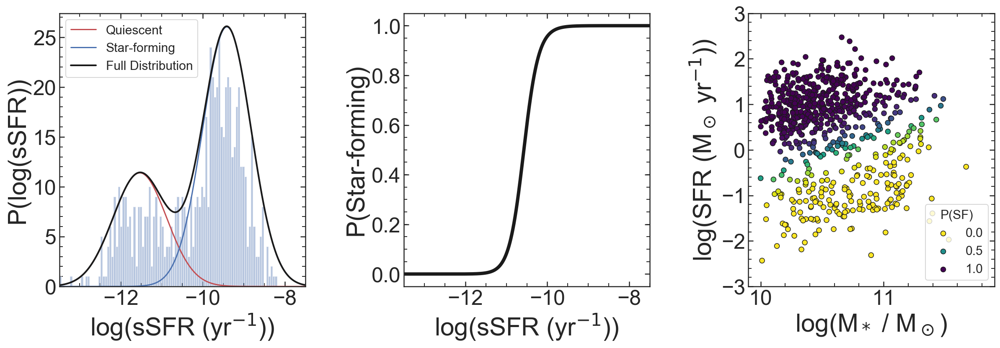

In [658]:
gs = gridspec.GridSpec(1,3,wspace=0.4)
plt.figure(figsize=[20,6])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])

sea.distplot(Adb.log_ssfr,bins = 100, kde = False, ax = ax1)

ax1.plot(X, Qdist, 'r', label = 'Quiescent')
ax1.plot(X, SFdist, 'b', label = 'Star-forming')
ax1.plot(X, Qdist + SFdist, 'k', linewidth = 2, label = 'Full Distribution')
ax1.set_ylabel('P(log(sSFR))', fontsize=30)
ax1.set_xlabel('log(sSFR (yr$^{-1}$))', fontsize=30)
ax1.tick_params(axis='both', which='major', labelsize=25)
ax1.set_xlim(-13.5,-7.5)
ax1.legend(loc=2, fontsize=15)

ax2.plot(X, SFprob(X), 'k', linewidth = 4)
ax2.set_ylabel('P(Star-forming)', fontsize=30)
ax2.set_xlabel('log(sSFR (yr$^{-1}$))', fontsize=30)
ax2.tick_params(axis='both', which='major', labelsize=25)
ax2.set_xlim(-13.5,-7.5)


sea.scatterplot(Adb.lmass, Adb.log_sfr, hue = Adb.sf_prob.values, ax = ax3, legend = False, palette='viridis_r', edgecolor = 'k')
ax3.set_ylabel('log(SFR (M$_\odot$ yr$^{-1}$))', fontsize=30)
ax3.set_xlabel('log(M$_*$ / M$_\odot$)', fontsize=30)
ax3.tick_params(axis='both', which='major', labelsize=25)
ax3.set_xlim(9.9,11.9)
ax3.set_ylim(-3,3)
sea.scatterplot([-100],[-100], hue = [0], hue_norm = (0,1), ax = ax3, legend = False, label = '0.0', palette='viridis_r', edgecolor = 'k')
sea.scatterplot([-100],[-100], hue = [0.5], hue_norm = (0,1), ax = ax3, legend = False, label = '0.5', palette='viridis_r', edgecolor = 'k')
sea.scatterplot([-100],[-100], hue = [1], hue_norm = (0,1), ax = ax3, legend = False, label = '1.0', palette='viridis_r', edgecolor = 'k')



ax3.legend(loc=4, fontsize=15, title = 'P(SF)')
ax3.get_legend().get_title().set_fontsize('15')


/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


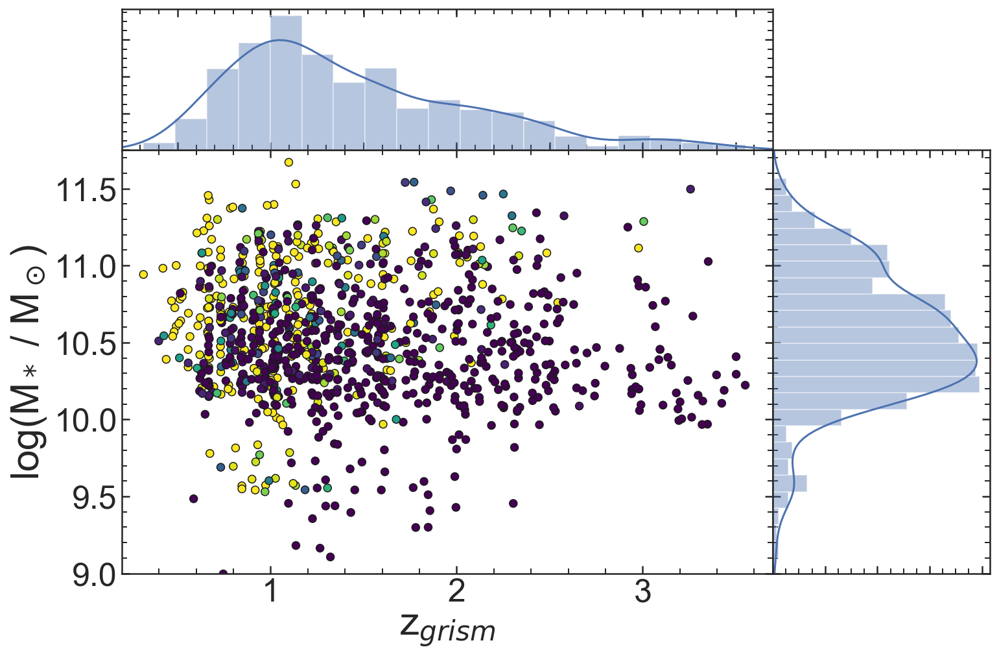

In [659]:
plt.figure(figsize=[12,8])
gs=gridspec.GridSpec(2,2, width_ratios=[3,1], height_ratios=[1,3], wspace=0, hspace=0)
ax1 = plt.subplot(gs[1,0])
ax2 = plt.subplot(gs[0,0])
ax3 = plt.subplot(gs[1,1])

sea.scatterplot(adb.zgrism, adb.lmass, hue = adb.sf_prob.values, 
                legend = False, palette='viridis_r', edgecolor = 'k', ax = ax1)
sea.distplot(adb.zgrism, ax = ax2)
sea.distplot(adb.lmass, ax = ax3, vertical=True)
ax2.set_xticklabels([])
ax2.set_yticklabels([])
ax3.set_xticklabels([])
ax3.set_yticklabels([])
ax1.set_xlim(0.2,3.7)
ax2.set_xlim(0.2,3.7)
ax1.set_ylim(9.,11.75)
ax3.set_ylim(9.,11.75)


ax2.set_xlabel('')
ax3.set_ylabel('')

ax1.set_ylabel('log(M$_*$ / M$_\odot$)', fontsize=30)
ax1.set_xlabel('z$_{grism}$', fontsize=30)
ax1.tick_params(axis='both', which='major', labelsize=25)

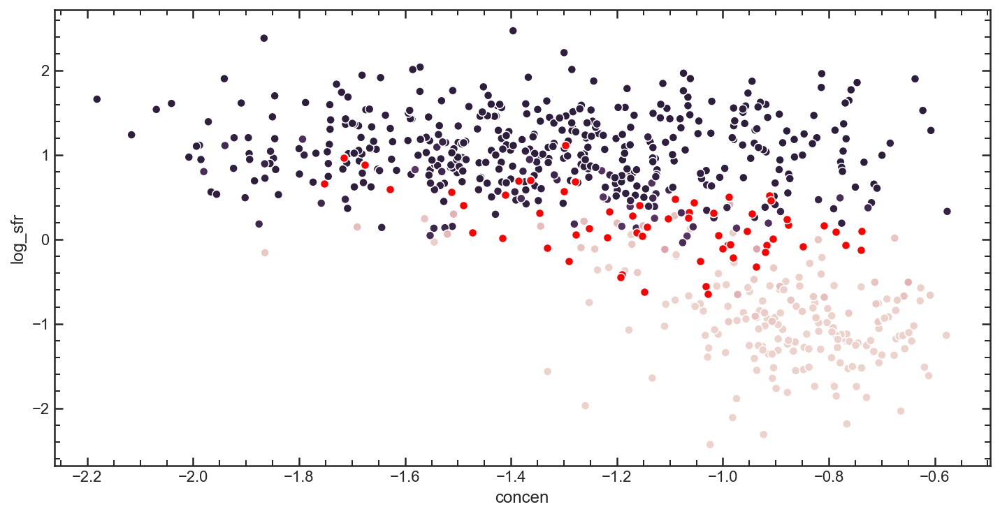

In [660]:
plt.figure(figsize=[12,6])
sea.scatterplot(Adb.concen, Adb.log_sfr, hue = Adb.sf_prob.values, legend = False)
sea.scatterplot(Adb.query('0.2 < sf_prob < 0.8').concen, 
                Adb.query('0.2 < sf_prob < 0.8').log_sfr, color = 'red', legend = False)

# plt.xlim(-2.4,-0.5)

In [661]:
from scipy.ndimage import gaussian_filter as norm_kde

zgrism = Adb.sort_values('zgrism').zgrism.values
log_ssfr = Adb.sort_values('zgrism').log_ssfr
idx=0

Qs = []
Sf = []
Sp = []
zs = []

size = 400
step = 5
while (size + step*idx) < len(zgrism):
    zs.append(np.median(zgrism[0 + step*idx:size + step*idx]))
    samp = log_ssfr[0 + step*idx:size + step*idx]
    samp = samp[samp > -11.5]
    y,x=np.histogram(samp,50)
    x=(x[1:]+x[:-1])/2 # for len(x)==len(y)

    mug1 = max1 = mug2 = max2 = 0
    for ii in range(len(x)):
        if x[ii] < -10.3:
            if y[ii] > max1:
                mug1 = x[ii]
                max1 = y[ii]  

        if x[ii] > -10.3:
            if y[ii] > max2:
                mug2 = x[ii]
                max2 = y[ii] 
    expected =[mug2,.1, max2],

    params,cov=curve_fit(gauss,x,y,expected)
    
    sigma=np.sqrt(np.diag(cov))
    mu2, sig2, A2 = params
    
    X = np.linspace(-14, -7, 1000)
    SFdist = gauss(X, mu2, sig2, A2)
    Sf.append(SFdist)

    kde =stats.gaussian_kde(log_ssfr[0 + step*idx:size + step*idx])

    kde_n = (kde(X)/max(kde(X)) * max(SFdist))
    Sint = []
    Fint = []
    
    for ii in range(len(X)):
        Sint.append(np.trapz(SFdist[ii:ii+2],X[ii:ii+2]))    
        Fint.append(np.trapz(kde_n[ii:ii+2],X[ii:ii+2]))    


    SFprob = interp1d(X,np.array(Sint) / np.array(Fint))
    
    Sp_n = []
    val = 0
    switch = False
    sp = np.zeros_like(SFprob(X))
    for ii in range(len(SFprob(X))):
        if val >0.9999:
            switch = True
        else:
            val = SFprob(X)[ii]  
        sp[ii] = SFprob(X)[ii]   
        if switch:
            sp[ii] = 1   
    sp[sp > 1]=1
    Sp.append(sp)
    idx += 1
    

/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/ipykernel_launcher.py:54: RuntimeWarning: invalid value encountered in true_divide


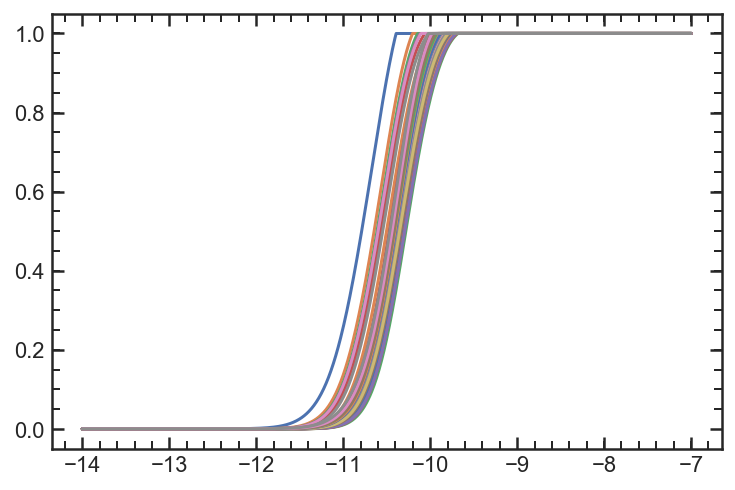

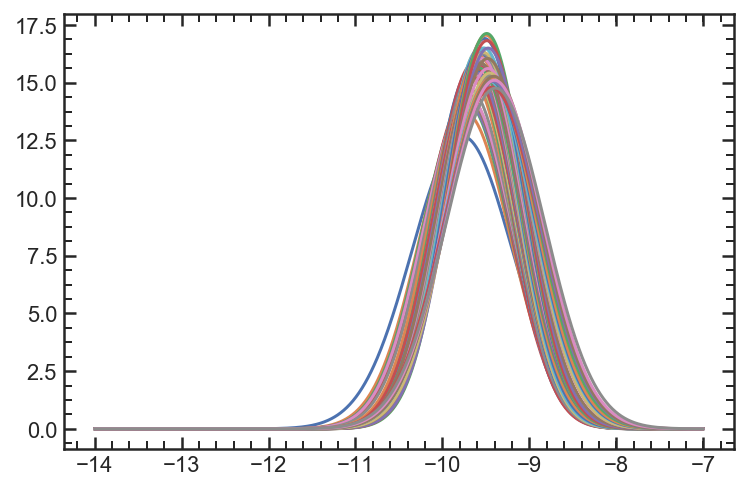

In [662]:
plt.figure()
for i in Sp:
    plt.plot(X,i)

plt.figure()
for i in Sf:
    plt.plot(X,i)

-10.636636636636636 -10.412412412412412


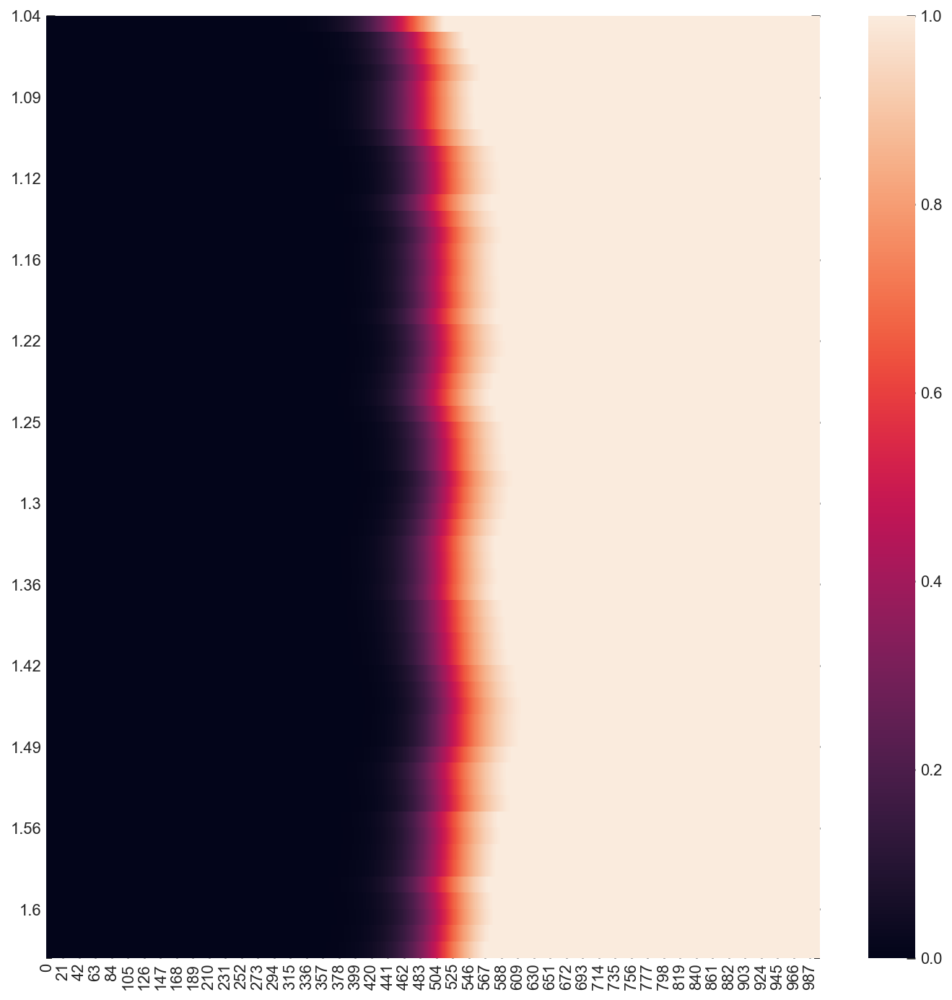

In [663]:
plt.figure(figsize=[12,12])
sea.heatmap(Sp)
# plt.yticks(zs)

num = np.arange(0,len(zs),5)
znum = []

for i in range(len(num)):
    znum.append(np.round(zs[num[i]],2))

plt.yticks(num,znum)

(print(X[480],X[512]))

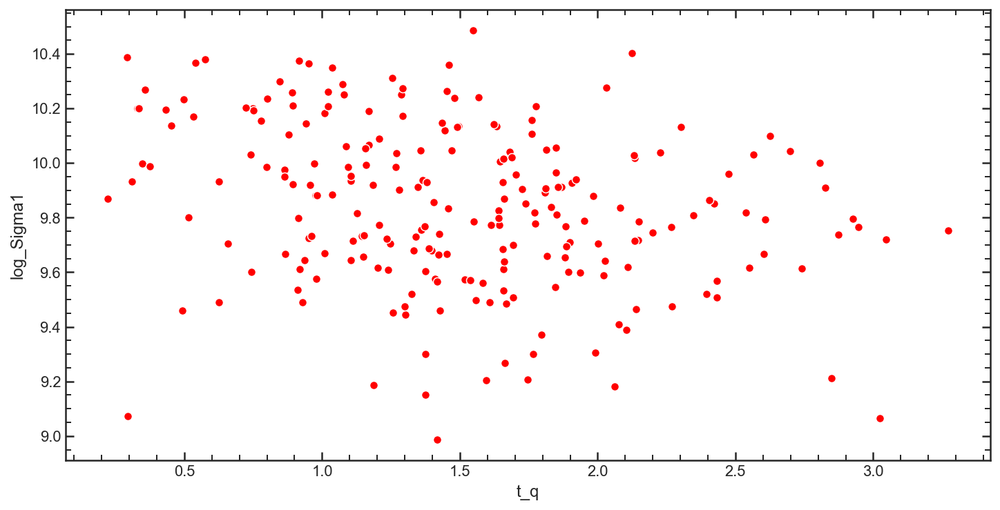

In [388]:
plt.figure(figsize=[12,6])
sea.scatterplot(Adb.query('sf_prob < 0.2').t_q, 
                Adb.query('sf_prob < 0.2').log_Sigma1, color = 'red', legend = False)

# plt.xlim(-2.4,-0.5)

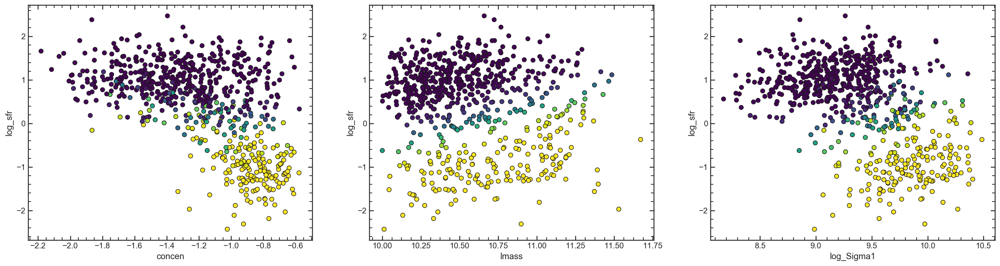

In [664]:
plt.figure(figsize=[24,6])
gs = gridspec.GridSpec(1,3)

ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])

param = 'log_sfr'

sea.scatterplot(Adb.concen, Adb[param], ax = ax1, hue = Adb.sf_prob.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

sea.scatterplot(Adb.lmass, Adb[param], ax = ax2, hue = Adb.sf_prob.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

sea.scatterplot(Adb.log_Sigma1, Adb[param], ax = ax3, hue = Adb.sf_prob.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')


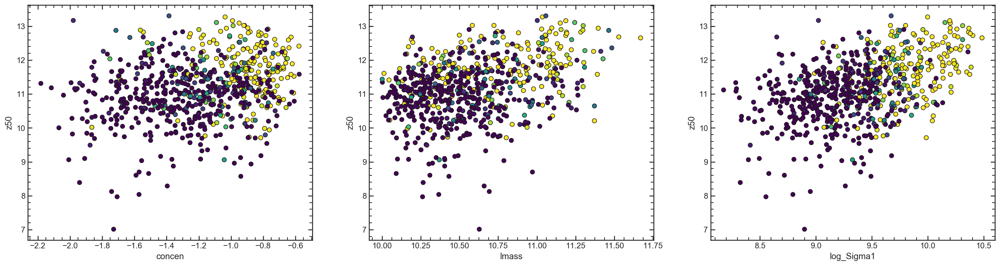

In [684]:
plt.figure(figsize=[24,6])
gs = gridspec.GridSpec(1,3)

ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])

param = 'z50'

sea.scatterplot(Adb.concen, Adb[param], ax = ax1, hue = Adb.sf_prob.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

sea.scatterplot(Adb.lmass, Adb[param], ax = ax2, hue = Adb.sf_prob.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

sea.scatterplot(Adb.log_Sigma1, Adb[param], ax = ax3, hue = Adb.sf_prob.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')


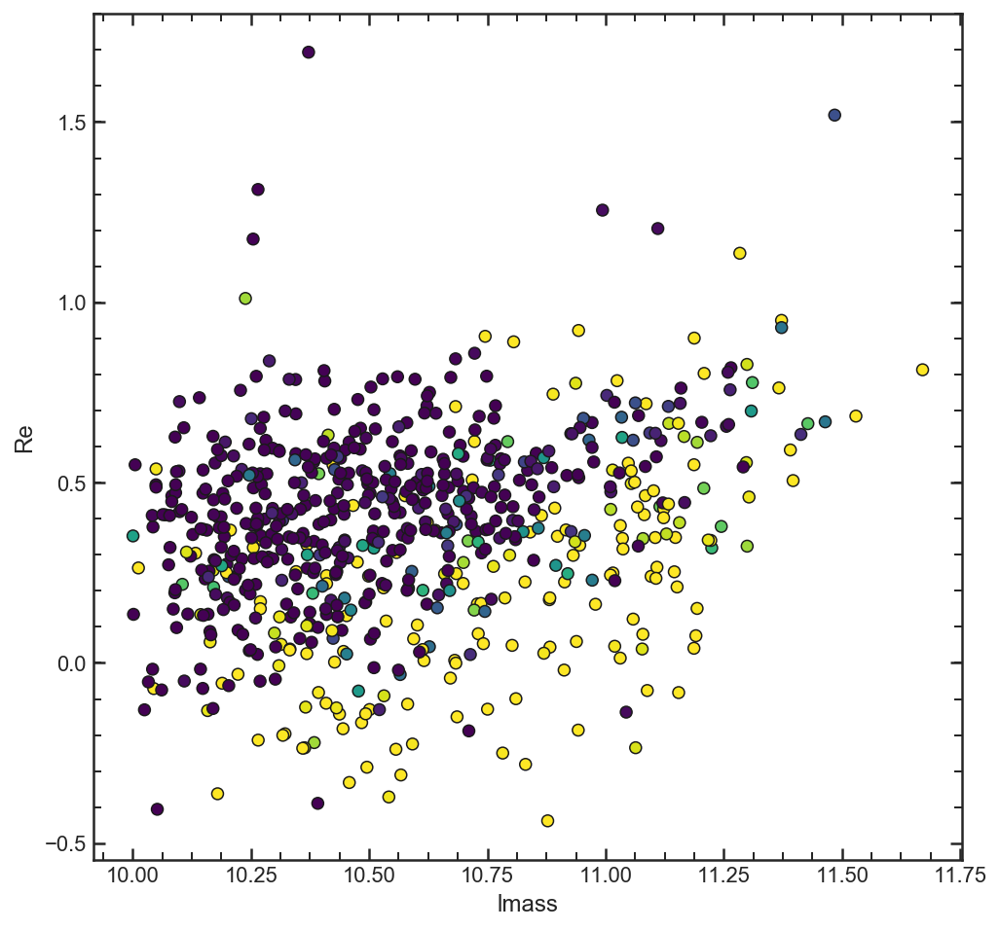

In [666]:
plt.figure(figsize=[8,8])

sea.scatterplot(Adb.lmass, np.log10(Adb.Re),hue = Adb.sf_prob.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')


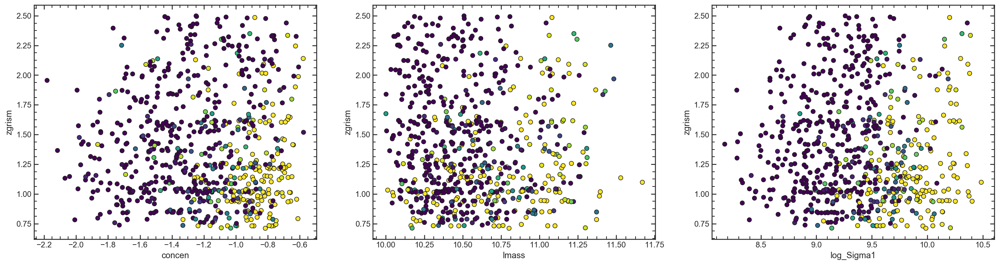

In [667]:
plt.figure(figsize=[24,6])
gs = gridspec.GridSpec(1,3)

ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])

param = 'zgrism'

sea.scatterplot(Adb.concen, Adb[param], ax = ax1, hue = Adb.sf_prob.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

sea.scatterplot(Adb.lmass, Adb[param], ax = ax2, hue = Adb.sf_prob.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')

sea.scatterplot(Adb.log_Sigma1, Adb[param], ax = ax3, hue = Adb.sf_prob.values, legend = False, 
                palette='viridis_r', edgecolor = 'k')


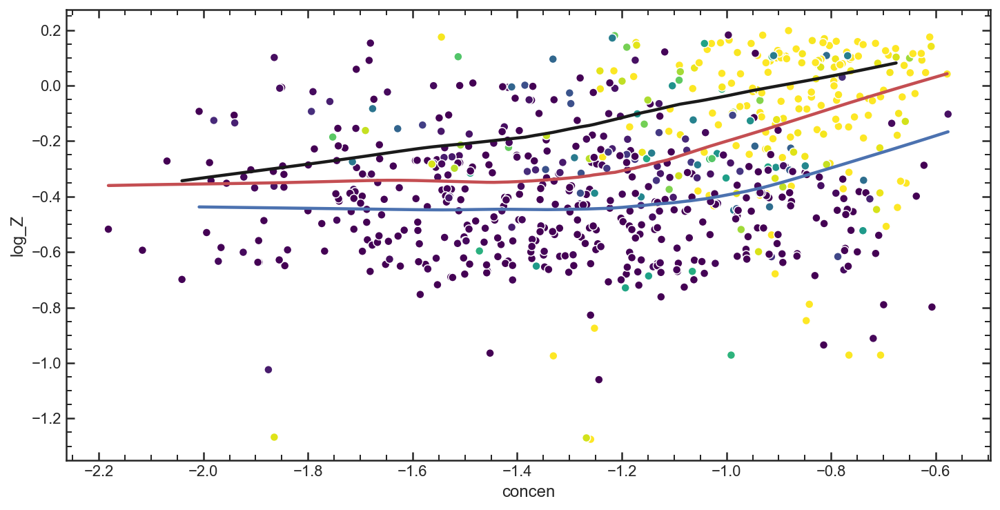

In [668]:
lims= [10,10.5,11,11.5]

plt.figure(figsize=[12,6])

cols = ['b','r','k']
sea.scatterplot(Adb.concen,Adb.log_Z, hue = Adb.sf_prob, legend=False, palette='viridis_r')

for i in range(len(lims)-1):
    sea.regplot(Adb.query('{} < lmass < {} '.format(lims[i], lims[i+1])).concen,
                Adb.query('{} < lmass < {} '.format(lims[i], lims[i+1])).log_Z,
                lowess = True, color = cols[i], scatter = False)

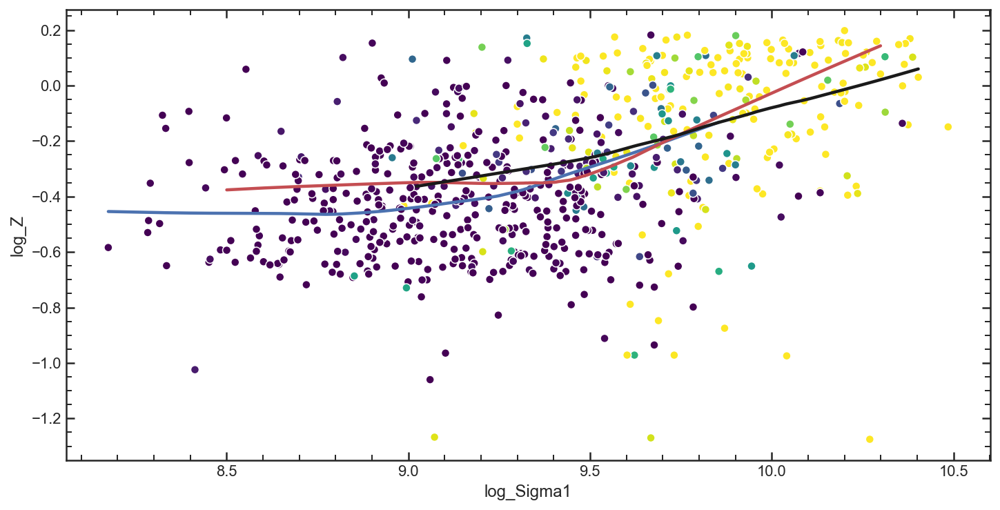

In [669]:
lims= [10,10.5,11,11.5]

plt.figure(figsize=[12,6])

cols = ['b','r','k']
sea.scatterplot(Adb.log_Sigma1,Adb.log_Z, hue = Adb.sf_prob, legend=False, palette='viridis_r')

for i in range(len(lims)-1):
    sea.regplot(Adb.query('{} < lmass < {} '.format(lims[i], lims[i+1])).log_Sigma1,
                Adb.query('{} < lmass < {} '.format(lims[i], lims[i+1])).log_Z,
                lowess = True, color = cols[i], scatter = False)

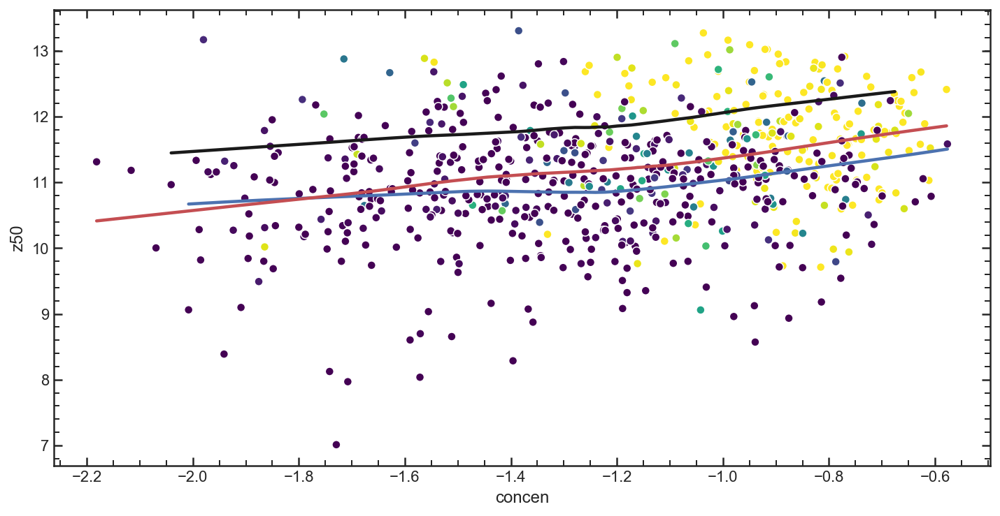

In [670]:
lims= [10,10.5,11,11.5]

plt.figure(figsize=[12,6])

cols = ['b','r','k']
sea.scatterplot(Adb.concen,Adb.z50, hue = Adb.sf_prob, legend=False, palette='viridis_r')

for i in range(len(lims)-1):
    sea.regplot(Adb.query('{} < lmass < {} '.format(lims[i], lims[i+1])).concen,
               Adb.query('{} < lmass < {} '.format(lims[i], lims[i+1])).z50,
                lowess = True, color = cols[i], scatter = False)

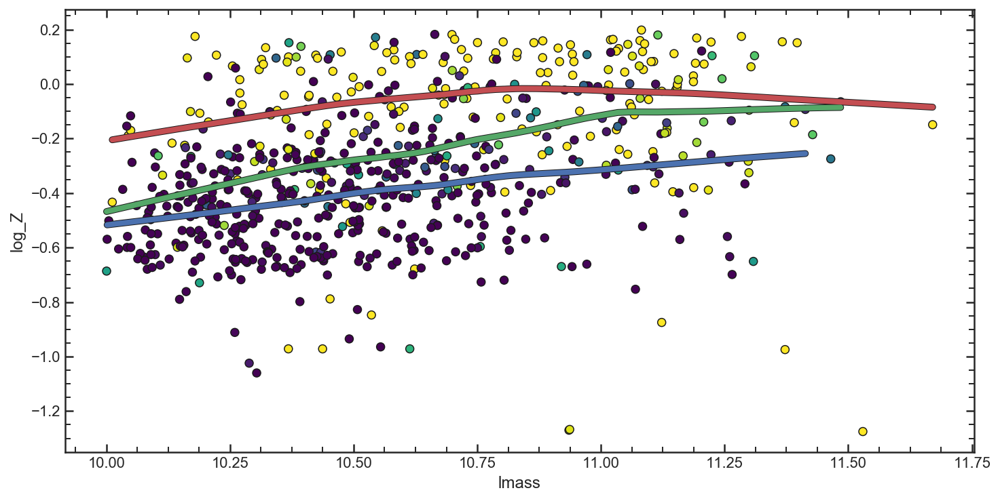

In [671]:
plt.figure(figsize=[12,6])
sea.scatterplot(Adb.lmass,Adb.log_Z, hue = Adb.sf_prob, legend=False, palette='viridis_r', edgecolor = 'k',)


sea.regplot(Adb.query('sf_prob < 0.2').lmass,Adb.query('sf_prob < 0.2').log_Z,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5})
sea.regplot(Adb.query('0.2< sf_prob < 0.8').lmass,Adb.query('0.2< sf_prob < 0.8').log_Z,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5})
sea.regplot(Adb.query('sf_prob > 0.8').lmass,Adb.query('sf_prob > 0.8').log_Z,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5})


sea.regplot(Adb.query('sf_prob < 0.2').lmass,Adb.query('sf_prob < 0.2').log_Z,
            lowess = True, color = 'r', scatter = False, line_kws = {'linewidth':4})
sea.regplot(Adb.query('0.2< sf_prob < 0.8').lmass,Adb.query('0.2< sf_prob < 0.8').log_Z,
            lowess = True, color = 'g', scatter = False, line_kws = {'linewidth':4})
sea.regplot(Adb.query('sf_prob > 0.8').lmass,Adb.query('sf_prob > 0.8').log_Z,
            lowess = True, color = 'b', scatter = False, line_kws = {'linewidth':4})

(0, 6)

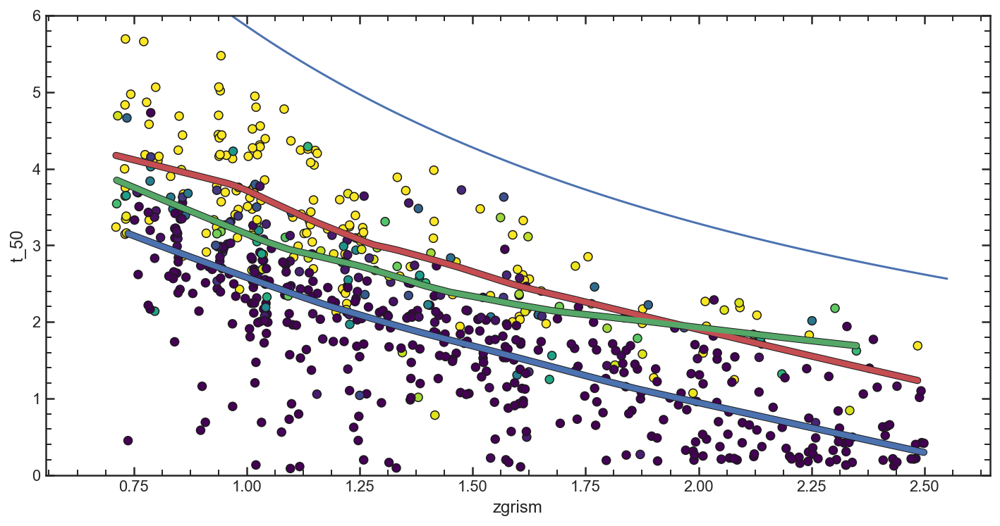

In [676]:
plt.figure(figsize=[12,6])
sea.scatterplot(Adb.zgrism,Adb.t_50, hue = Adb.sf_prob, legend=False, palette='viridis_r', edgecolor = 'k',)

zs = np.linspace(0.65,2.55,100)
plt.plot(zs, cosmo.age(zs).value)

sea.regplot(Adb.query('sf_prob < 0.2').zgrism,Adb.query('sf_prob < 0.2').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5})
sea.regplot(Adb.query('0.2< sf_prob < 0.8').zgrism,Adb.query('0.2< sf_prob < 0.8').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5})
sea.regplot(Adb.query('sf_prob > 0.8').zgrism,Adb.query('sf_prob > 0.8').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5})


sea.regplot(Adb.query('sf_prob < 0.2').zgrism,Adb.query('sf_prob < 0.2').t_50,
            lowess = True, color = 'r', scatter = False, line_kws = {'linewidth':4})
sea.regplot(Adb.query('0.2< sf_prob < 0.8').zgrism,Adb.query('0.2< sf_prob < 0.8').t_50,
            lowess = True, color = 'g', scatter = False, line_kws = {'linewidth':4})
sea.regplot(Adb.query('sf_prob > 0.8').zgrism,Adb.query('sf_prob > 0.8').t_50,
            lowess = True, color = 'b', scatter = False, line_kws = {'linewidth':4})

plt.ylim(0,6)

(0, 5.5)

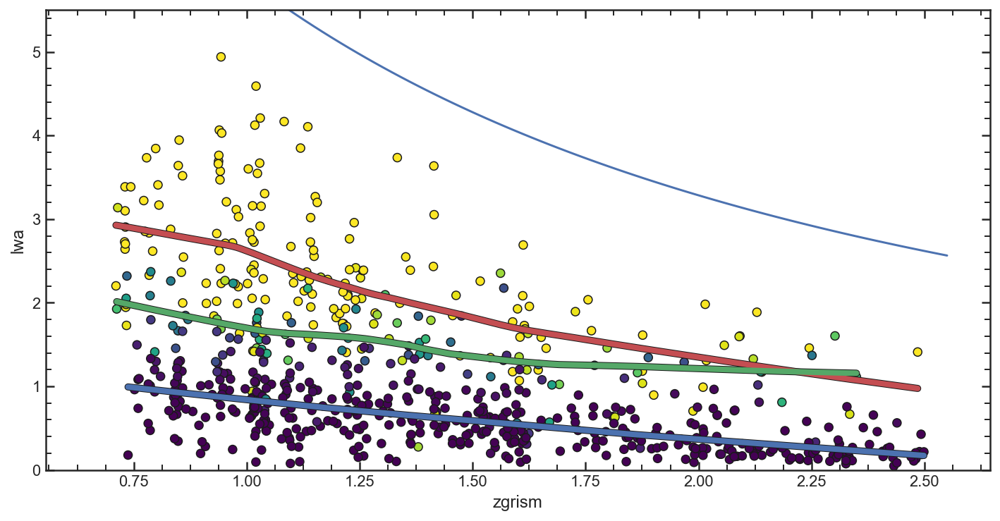

In [681]:
plt.figure(figsize=[12,6])
sea.scatterplot(Adb.zgrism,Adb.lwa, hue = Adb.sf_prob, legend=False, palette='viridis_r', edgecolor = 'k',)

zs = np.linspace(0.65,2.55,100)
plt.plot(zs, cosmo.age(zs).value)

sea.regplot(Adb.query('sf_prob < 0.2').zgrism,Adb.query('sf_prob < 0.2').lwa,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5})
sea.regplot(Adb.query('0.2< sf_prob < 0.8').zgrism,Adb.query('0.2< sf_prob < 0.8').lwa,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5})
sea.regplot(Adb.query('sf_prob > 0.8').zgrism,Adb.query('sf_prob > 0.8').lwa,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5})


sea.regplot(Adb.query('sf_prob < 0.2').zgrism,Adb.query('sf_prob < 0.2').lwa,
            lowess = True, color = 'r', scatter = False, line_kws = {'linewidth':4})
sea.regplot(Adb.query('0.2< sf_prob < 0.8').zgrism,Adb.query('0.2< sf_prob < 0.8').lwa,
            lowess = True, color = 'g', scatter = False, line_kws = {'linewidth':4})
sea.regplot(Adb.query('sf_prob > 0.8').zgrism,Adb.query('sf_prob > 0.8').lwa,
            lowess = True, color = 'b', scatter = False, line_kws = {'linewidth':4})
plt.ylim(0,5.5)

(0, 6.5)

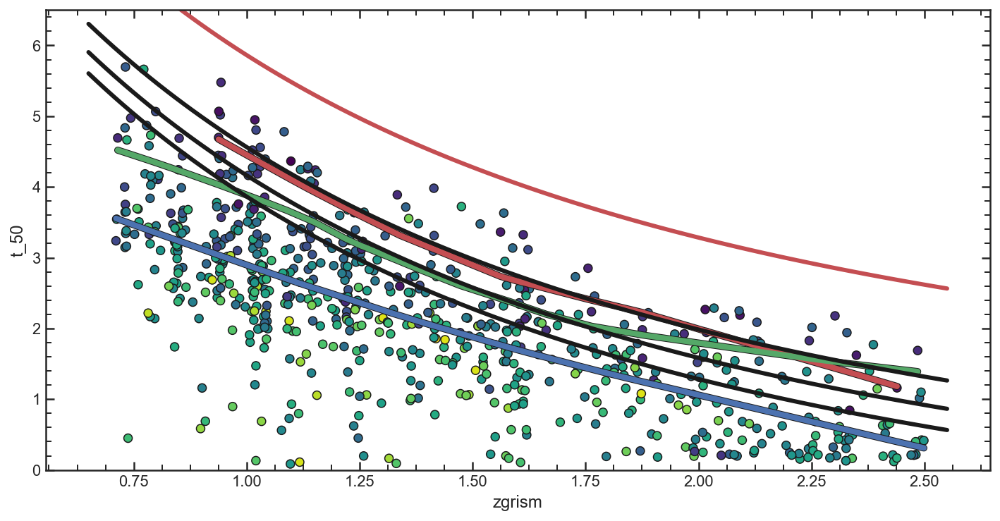

In [683]:
plt.figure(figsize=[12,6])
sea.scatterplot(Adb.zgrism,Adb.t_50, hue = Adb.log_Sigma1, legend=False, palette='viridis_r', edgecolor = 'k',)

zs = np.linspace(0.65,2.55,100)
plt.plot(zs, cosmo.age(zs).value, 'r', linewidth = 3,)

sea.regplot(Adb.query('log_Sigma1 > 10.25').zgrism,Adb.query('log_Sigma1 > 10.25').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5})
sea.regplot(Adb.query('10 < log_Sigma1 < 10.25').zgrism,Adb.query('10 < log_Sigma1 < 10.25').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5})
sea.regplot(Adb.query('log_Sigma1 < 10').zgrism,Adb.query('log_Sigma1 < 10').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5})


sea.regplot(Adb.query('log_Sigma1 > 10.25').zgrism,Adb.query('log_Sigma1 > 10.25').t_50,
            lowess = True, color = 'r', scatter = False, line_kws = {'linewidth':4})
sea.regplot(Adb.query('10 < log_Sigma1 < 10.25').zgrism,Adb.query('10 < log_Sigma1 < 10.25').t_50,
            lowess = True, color = 'g', scatter = False, line_kws = {'linewidth':4})
sea.regplot(Adb.query('log_Sigma1 < 10').zgrism,Adb.query('log_Sigma1 < 10').t_50,
            lowess = True, color = 'b', scatter = False, line_kws = {'linewidth':4})
plt.plot(zs, cosmo.age(zs).value-1.3, 'k', linewidth = 3)
plt.plot(zs, cosmo.age(zs).value-1.7, 'k', linewidth = 3)
plt.plot(zs, cosmo.age(zs).value-2, 'k', linewidth = 3)

plt.ylim(0,6.5)

(0, 6)

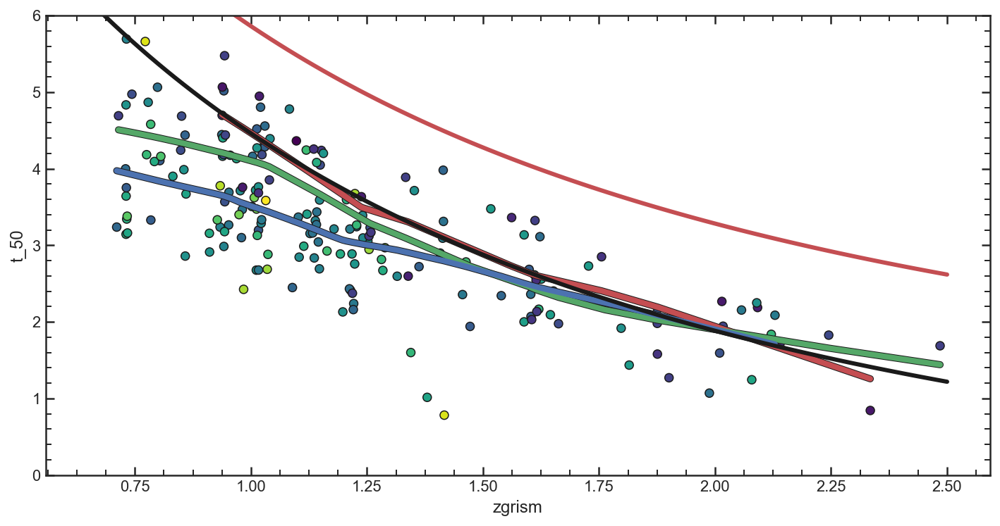

In [678]:
plt.figure(figsize=[12,6])
sea.scatterplot(Adb.query('sf_prob < 0.2').zgrism,Adb.query('sf_prob < 0.2').t_50, hue = Adb.query('sf_prob < 0.2').log_Sigma1, legend=False, palette='viridis_r', edgecolor = 'k',)

zs = np.linspace(0.65,2.5,100)
plt.plot(zs, cosmo.age(zs).value, 'r', linewidth = 3,)

sea.regplot(Adb.query('sf_prob < 0.2 and log_Sigma1 > 10.25').zgrism,Adb.query('sf_prob < 0.2 and log_Sigma1 > 10.25').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5})
sea.regplot(Adb.query('sf_prob < 0.2 and 10 < log_Sigma1 < 10.25').zgrism,Adb.query('sf_prob < 0.2 and 10 < log_Sigma1 < 10.25').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5})
sea.regplot(Adb.query('sf_prob < 0.2 and log_Sigma1 < 10').zgrism,Adb.query('sf_prob < 0.2 and log_Sigma1 < 10').t_50,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5})


sea.regplot(Adb.query('sf_prob < 0.2 and log_Sigma1 > 10.25').zgrism,Adb.query('sf_prob < 0.2 and log_Sigma1 > 10.25').t_50,
            lowess = True, color = 'r', scatter = False, line_kws = {'linewidth':4})
sea.regplot(Adb.query('sf_prob < 0.2 and 10 < log_Sigma1 < 10.25').zgrism,Adb.query('sf_prob < 0.2 and 10 < log_Sigma1 < 10.25').t_50,
            lowess = True, color = 'g', scatter = False, line_kws = {'linewidth':4})
sea.regplot(Adb.query('sf_prob < 0.2 and log_Sigma1 < 10').zgrism,Adb.query('sf_prob < 0.2 and log_Sigma1 < 10').t_50,
            lowess = True, color = 'b', scatter = False, line_kws = {'linewidth':4})
plt.plot(zs, cosmo.age(zs).value-1.4, 'k', linewidth = 3)
# plt.plot(zs, cosmo.age(zs).value-1.7, 'k', linewidth = 3)
# plt.plot(zs, cosmo.age(zs).value-2, 'k', linewidth = 3)

plt.ylim(0,6)

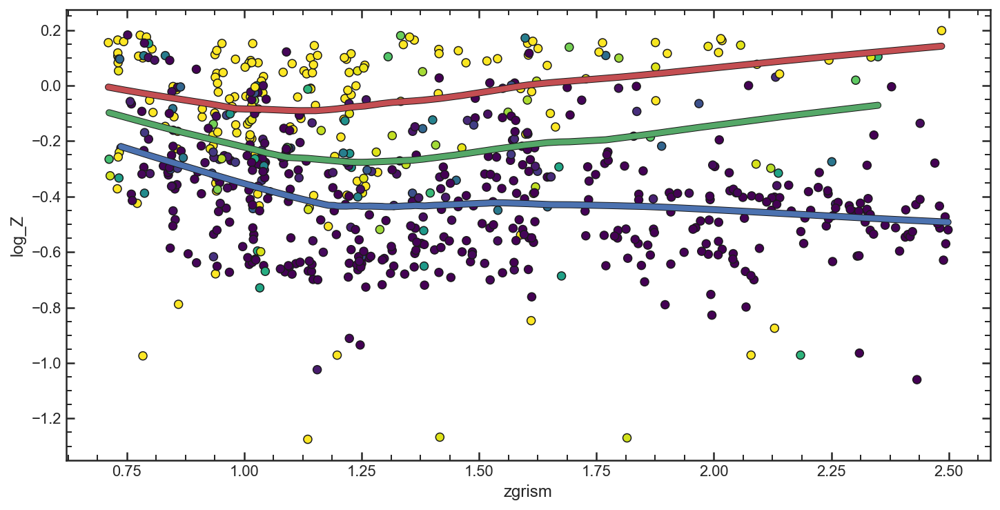

In [679]:
plt.figure(figsize=[12,6])
sea.scatterplot(Adb.zgrism,Adb.log_Z, hue = Adb.sf_prob, legend=False, palette='viridis_r', edgecolor = 'k',)

sea.regplot(Adb.query('sf_prob < 0.2').zgrism,Adb.query('sf_prob < 0.2').log_Z,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5})
sea.regplot(Adb.query('0.2< sf_prob < 0.8').zgrism,Adb.query('0.2< sf_prob < 0.8').log_Z,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5})
sea.regplot(Adb.query('sf_prob > 0.8').zgrism,Adb.query('sf_prob > 0.8').log_Z,
            lowess = True, color = 'k', scatter = False, line_kws = {'linewidth':5})


sea.regplot(Adb.query('sf_prob < 0.2').zgrism,Adb.query('sf_prob < 0.2').log_Z,
            lowess = True, color = 'r', scatter = False, line_kws = {'linewidth':4})
sea.regplot(Adb.query('0.2< sf_prob < 0.8').zgrism,Adb.query('0.2< sf_prob < 0.8').log_Z,
            lowess = True, color = 'g', scatter = False, line_kws = {'linewidth':4})
sea.regplot(Adb.query('sf_prob > 0.8').zgrism,Adb.query('sf_prob > 0.8').log_Z,
            lowess = True, color = 'b', scatter = False, line_kws = {'linewidth':4})


In [685]:
from spec_stats import Leave_one_out
def Sum_SFH(lbt, sfh):
    return np.sum(SFH_grid, axis=0)

def Sum_SFH_bs(lbt, sfh, its = 1000):
    sfh_bs = []
    w = Leave_one_out(np.array(sfh), lbt)
    wsfh = [w[U]*sfh[U] for U in range(len(sfh))]
    for xx in range(its):
        IDX = np.random.choice(range(len(sfh)) , len(sfh))            
        S= np.sum(np.array(wsfh)[IDX], axis=0)
        istack = interp1d(lbt,S, bounds_error=False, fill_value=0)(lbt)
        sfh_bs.append(istack)
        iT = interp1d(np.cumsum(istack[::-1]) / np.cumsum(istack[::-1])[-1], lbt - min(lbt))
        
    sfh_bs = np.array(sfh_bs)
    ################   
    SFH = []
    SFH16 = []
    SFH84 = []
    ltimes = []

    for i in range(len(sfh_bs.T)):
        gdat = sfh_bs.T[i][sfh_bs.T[i]>0]
        
        if len(gdat) > 0:
            SFH.append(np.percentile(gdat,50))
            SFH16.append(np.percentile(gdat,16))
            SFH84.append(np.percentile(gdat,84))
            ltimes.append(lbt[i])
            
    SFH = np.array(SFH)
    SFH16 = np.array(SFH16)
    SFH84 = np.array(SFH84)
    LBT = np.array(ltimes)
    return LBT, SFH, SFH16, SFH84

In [686]:
import pickle
from make_sfh_tool import Gen_SFH

def SFH_bin(z1,z2,lm1,lm2, param):
    LBT = np.linspace(0,14, 1000)
    SFH_grid = []

    for i in Adb.query('{} < zgrism < {} and {} < {} < {}'.format(z1,z2,lm1,param,lm2)).index:
        s1_grid = []
        M_grid = []

        try:
            lbt, sfh = np.load('../data/SFH/{0}_{1}.npy'.format(Adb.field[i], Adb.id[i])) 
        except:
            try:
                with open('../data/SFH/{}_{}.pkl'.format(Adb.field[i], Adb.id[i]), 'rb') as sfh_file:
                    sfh = pickle.load(sfh_file)
                lbt = sfh.LBT 
                sfh = sfh.SFH 
                
            except:
                with open('../data/SFH/{}_{}_1D.pkl'.format(Adb.field[i], Adb.id[i]), 'rb') as sfh_file:
                    sfh = pickle.load(sfh_file)
                lbt = sfh.LBT 
                sfh = sfh.SFH   

        isfh = interp1d(lbt+cosmo.lookback_time(Adb.zgrism[i]).value,sfh, bounds_error=False, fill_value=0)(LBT)
        SFH_grid.append(isfh)
    L,S,S16,S84 = Sum_SFH_bs(LBT, SFH_grid)
    return L,S,S16,S84

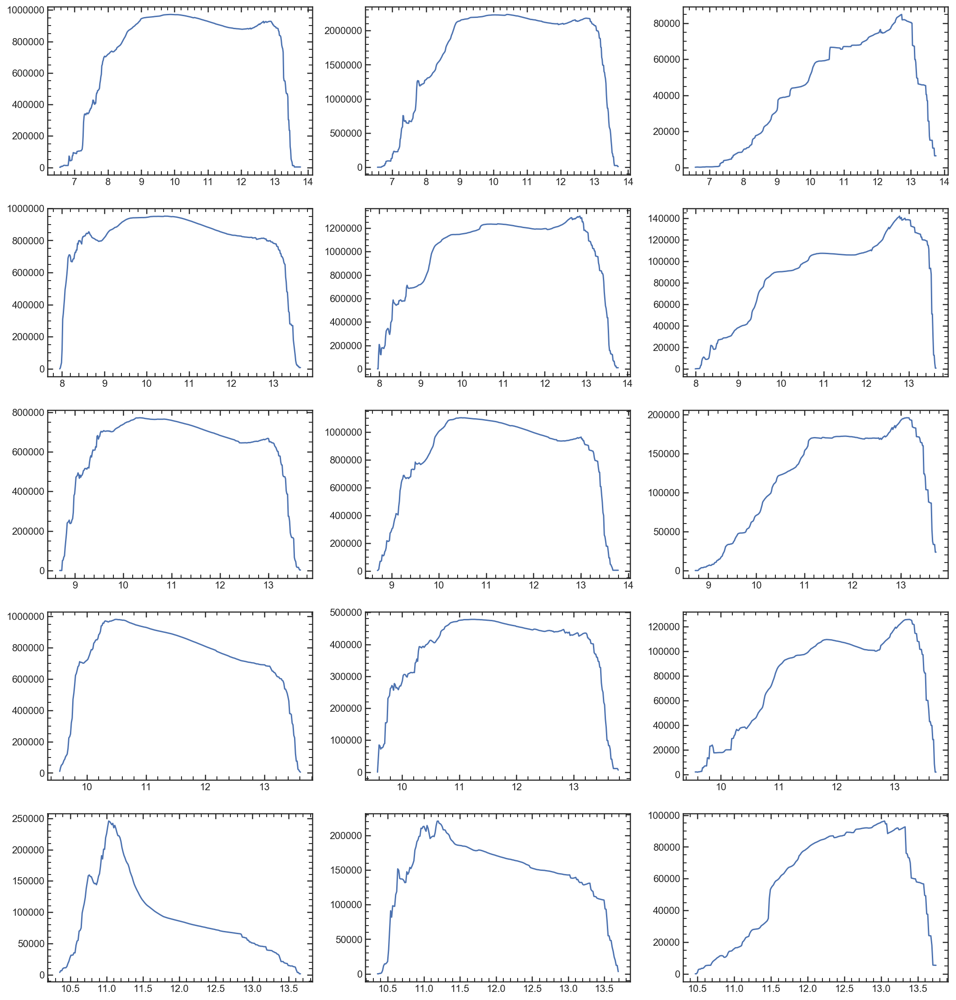

In [687]:
zlims = [0.7,1.0, 1.2, 1.5, 1.9, 2.5]
lmlims = [10, 10.5, 11, 11.5]

gs = gridspec.GridSpec(5,3)
plt.figure(figsize=[18,20])

for i in range(len(zlims)-1):
    for ii in range(len(lmlims)-1):
        plt.subplot(gs[i,ii])
        try:
            L,S,S16,S84 = SFH_bin(zlims[i], zlims[i+1], lmlims[ii], lmlims[ii+1], 'lmass')
            plt.plot(L,S)
        except:
            pass

/Users/Vince.ec/GitHub/Cluster_and_field/scripts/spec_stats.py:170: RuntimeWarning: invalid value encountered in true_divide
  Y /= np.trapz(Y, x)


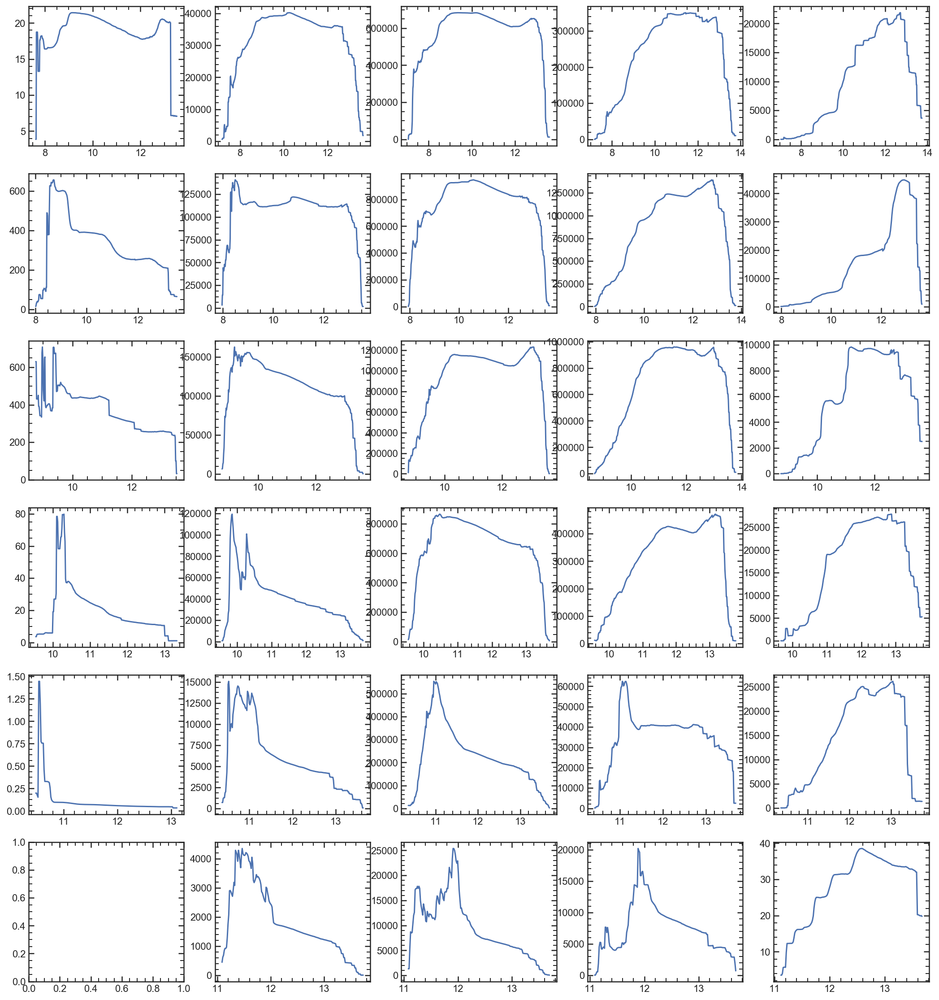

In [124]:
zlims = [0.8,1.0, 1.2, 1.5, 1.9, 2.4, 3.5]
lmlims = [8.0, 8.5, 9, 9.5, 10, 10.5]

gs = gridspec.GridSpec(6,5)
plt.figure(figsize=[18,20])

for i in range(len(zlims)-1):
    for ii in range(len(lmlims)-1):
        plt.subplot(gs[i,ii])
        try:
            L,S,S16,S84 = SFH_bin(zlims[i], zlims[i+1], lmlims[ii], lmlims[ii+1], 'log_Sigma1')
            plt.plot(L,S)
        except:
            pass

/Users/Vince.ec/GitHub/Cluster_and_field/scripts/spec_stats.py:179: RuntimeWarning: invalid value encountered in true_divide
  Ybar /= np.trapz(Ybar, x)
/Users/Vince.ec/GitHub/Cluster_and_field/scripts/spec_stats.py:170: RuntimeWarning: invalid value encountered in true_divide
  Y /= np.trapz(Y, x)


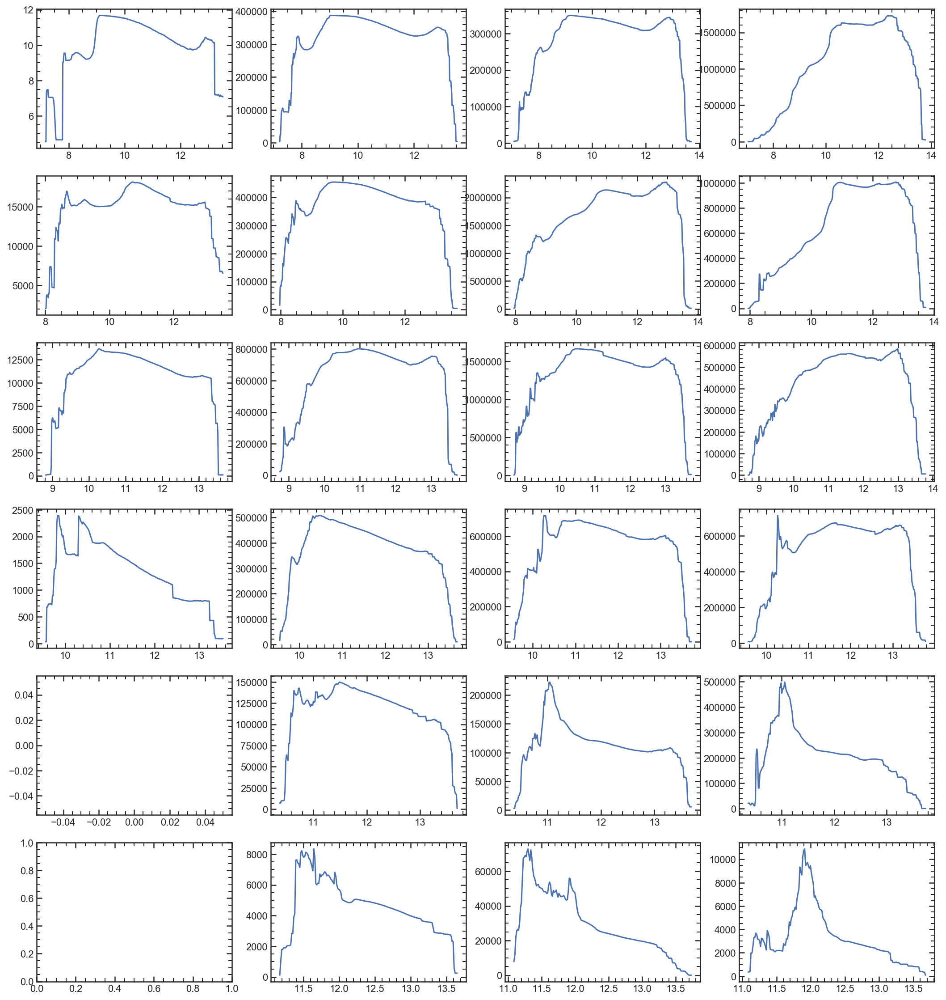

In [126]:
zlims = [0.8,1.0, 1.2, 1.5, 1.9, 2.4, 3.5]
lmlims = [-2.2, -1.8, -1.4, -1, -0.5]

gs = gridspec.GridSpec(6,4)
plt.figure(figsize=[18,20])

for i in range(len(zlims)-1):
    for ii in range(len(lmlims)-1):
        plt.subplot(gs[i,ii])
        try:
            L,S,S16,S84 = SFH_bin(zlims[i], zlims[i+1], lmlims[ii], lmlims[ii+1], 'concen')
            plt.plot(L,S)
        except:
            pass

In [127]:
import pickle
from make_sfh_tool import Gen_SFH

def SFH_bin(z1,z2,lm1,lm2, param):
    LBT = np.linspace(0,14, 1000)
    SFH_grid = []

    for i in Adb.query('{} < zgrism < {} and {} < {} < {}'.format(z1,z2,lm1,param,lm2)).index:
        s1_grid = []
        M_grid = []

        try:
            lbt, sfh = np.load('../data/SFH/{0}_{1}.npy'.format(Adb.field[i], Adb.id[i])) 
        except:
            try:
                with open('../data/SFH/{}_{}.pkl'.format(Adb.field[i], Adb.id[i]), 'rb') as sfh_file:
                    sfh = pickle.load(sfh_file)
                lbt = sfh.LBT 
                sfh = sfh.SFH 
                
            except:
                with open('../data/SFH/{}_{}_1D.pkl'.format(Adb.field[i], Adb.id[i]), 'rb') as sfh_file:
                    sfh = pickle.load(sfh_file)
                lbt = sfh.LBT 
                sfh = sfh.SFH   

                
        plt.plot(lbt+cosmo.lookback_time(Adb.zgrism[i]).value,sfh)
        isfh = interp1d(lbt+cosmo.lookback_time(Adb.zgrism[i]).value,sfh, bounds_error=False, fill_value=0)(LBT)
        SFH_grid.append(isfh)
    L,S,S16,S84 = Sum_SFH_bs(LBT, SFH_grid)
    return L,S,S16,S84

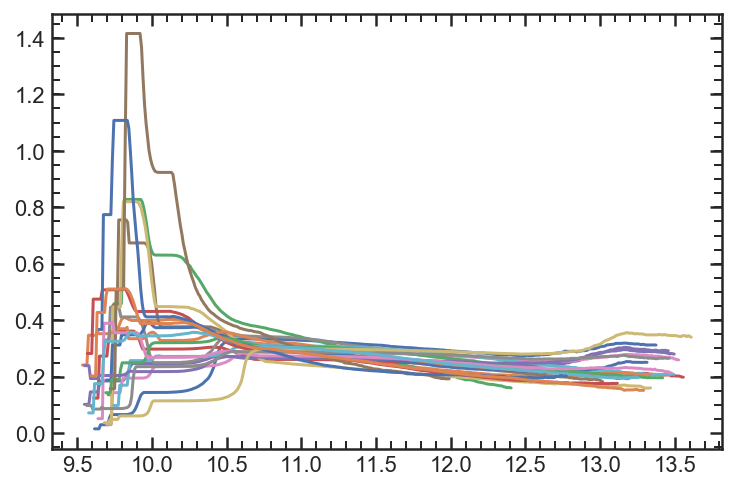

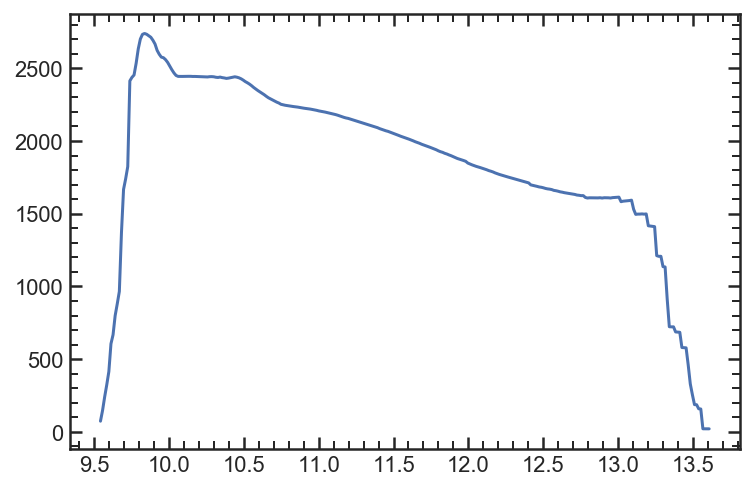

In [139]:
LBT = np.linspace(0,14, 1000)
SFH_grid = []
plt.figure()
for i in sfdb.query('{} < zgrism < {} and {} < {} < {}'.format(1.5, 1.6, 10, 'lmass', 10.5)).index:
    s1_grid = []
    M_grid = []

    try:
        lbt, sfh = np.load('../data/SFH/{0}_{1}.npy'.format(Adb.field[i], Adb.id[i])) 
    except:
        try:
            with open('../data/SFH/{}_{}.pkl'.format(Adb.field[i], Adb.id[i]), 'rb') as sfh_file:
                sfh = pickle.load(sfh_file)
            lbt = sfh.LBT 
            sfh = sfh.SFH 

        except:
            with open('../data/SFH/{}_{}_1D.pkl'.format(Adb.field[i], Adb.id[i]), 'rb') as sfh_file:
                sfh = pickle.load(sfh_file)
            lbt = sfh.LBT 
            sfh = sfh.SFH   


    plt.plot(lbt+cosmo.lookback_time(Adb.zgrism[i]).value,sfh/ np.trapz(sfh, lbt))
    isfh = interp1d(lbt+cosmo.lookback_time(Adb.zgrism[i]).value,sfh, bounds_error=False, fill_value=0)(LBT)
#     SFH_grid.append(isfh)
    SFH_grid.append(isfh/ np.trapz(isfh, LBT))

# for i in range(len(SFH_grid)):
#     plt.plot(LBT, SFH_grid[i])
    
    
L,S,S16,S84 = Sum_SFH_bs(LBT, SFH_grid)

plt.figure()
plt.plot(L,S)

In [798]:
Adb.query('id == 17579').bfa.values[0]

4.676011956241347

In [833]:
Gs = Gen_spec_2D('GSD',18933,Adb.query('id == 18933').zgrism.values[0])

Q_temps = Gen_temp_dict_addline(['Hd','Hg','Hb','Ha','OII','OIII','SII'])
lvals = [4102.89,4341.68,4862.68,6564.61,3727.092,5008.240,6718.29]

sp = fsps.StellarPopulation(zcontinuous = 1, logzsol = 0, sfh = 3, dust_type = 2)
sp.params['dust1'] = 0

sp.params['dust2'] = Adb.query('id == 18933').bfd.values[0]
sp.params['logzsol'] = np.log10(Adb.query('id == 18933').bfm.values[0])
    
time, sfr, tmax = convert_sfh(get_agebins(Adb.query('id == 18933').bfa.values[0], binnum = 6), 
                              [Adb.query('id == 18933').bfm1.values[0], Adb.query('id == 18933').bfm2.values[0], 
                               Adb.query('id == 18933').bfm3.values[0], Adb.query('id == 18933').bfm4.values[0], 
                               Adb.query('id == 18933').bfm5.values[0], Adb.query('id == 18933').bfm6.values[0]], 
                              maxage = Adb.query('id == 18933').bfa.values[0]*1E9)

sp.set_tabular_sfh(time,sfr) 
    
wave, flux = sp.get_spectrum(tage = Adb.query('id == 18933').bfa.values[0], peraa = True)
flam = F_lam_per_M(flux,wave*(1 + Gs.specz), Gs.specz, 0, sp.stellar_mass)*10**Adb.query('id == 18933').bflm.values[0]


Q_temps['fsps_model'] = SpectrumTemplate(wave=wave, flux=flam)

g102_fit = Gs.mb_g102.template_at_z(Gs.specz, templates = Q_temps, fitter='nnls')
g141_fit = Gs.mb_g141.template_at_z(Gs.specz, templates = Q_temps, fitter='nnls')

lines_dict = {}
idx = 0
for i in range(len(g102_fit['cfit'])):
    lname = list(g102_fit['cfit'].keys())[i]
    if lname[0] == 'l':
        vals = []
        sigs = []
        
        val, sig = g102_fit['cfit'][lname] 
        if val > 0:
            vals.append(val)
            sigs.append(sig)
        
        val, sig = g141_fit['cfit'][lname]
        if val > 0:
            vals.append(val)
            sigs.append(sig)    
        if len(vals) > 1:
            if lvals[idx] * (Gs.specz + 1) < 11300:
                lines_dict[lname.strip('line ')] = vals[0]
                lines_dict[lname.strip('line ') + '_sig'] = sigs[0]
            else:
                lines_dict[lname.strip('line ')] = vals[1]
                lines_dict[lname.strip('line ') + '_sig'] = sigs[1]
                
        if len(vals) == 1:
            lines_dict[lname.strip('line ')] = vals[0]
            lines_dict[lname.strip('line ') + '_sig'] = sigs[0]
            
        if len(vals) == 0:
            lines_dict[lname.strip('line ')] = -99
            lines_dict[lname.strip('line ') + '_sig'] = -99
            
        idx += 1
            

load_master_fits: /Volumes/Vince_CLEAR/RELEASE_v2.1.0/BEAMS/GS4/GS4_18933.beams.fits
1 ibhj07ygq_flt.fits G141
2 ibhj07ynq_flt.fits G141
3 ibhj07yuq_flt.fits G141
4 ibhj07z1q_flt.fits G141


/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-1.0.dev1443-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3596: RuntimeWarning: divide by zero encountered in true_divide
  self.ivar = 1/self.grism.data['ERR']**2


5 icxt28w5q_flt.fits G102
6 icxt28w6q_flt.fits G102
7 icxt28w9q_flt.fits G102
8 icxt28wbq_flt.fits G102
9 icxt29yaq_flt.fits G102
10 icxt29ybq_flt.fits G102
11 icxt29yeq_flt.fits G102
12 icxt29ygq_flt.fits G102


/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-1.0.dev1443-py3.5-macosx-10.6-x86_64.egg/grizli/multifit.py:1585: RuntimeWarning: divide by zero encountered in true_divide
  ivar = 1./(1/b.ivar + (self.sys_err*sciu)**2)
/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-1.0.dev1443-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:590: RuntimeWarning: invalid value encountered in true_divide
  self.optimal_profile = m/m.sum(axis=0)
/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-1.0.dev1443-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:640: RuntimeWarning: invalid value encountered in true_divide
  opt_flux = num.sum(axis=0)/den.sum(axis=0)
/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-1.0.dev1443-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:641: RuntimeWarning: divide by zero encountered in true_divide
  opt_var = 1./den.sum(axis=0)


False
advanced
False
advanced


In [834]:
lines_dict

{'Ha': -99,
 'Ha_sig': -99,
 'Hb': 2.569127907051627e-17,
 'Hb_sig': 1.4280248019564318e-17,
 'Hd': -99,
 'Hd_sig': -99,
 'Hg': 3.061985267719324e-17,
 'Hg_sig': 2.2126490044514283e-17,
 'OII': 1.7006485065074023e-17,
 'OIII': 1.0398774324648298e-17,
 'OIII_sig': 1.434899362399336e-17,
 'OII_sig': 1.3713006123425038e-17,
 'SII': -99,
 'SII_sig': -99}

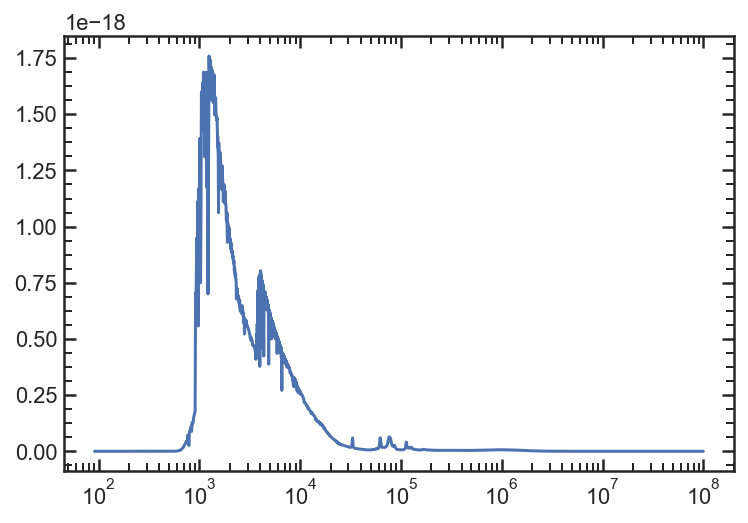

In [809]:
plt.plot(wave, flam)
plt.xscale('log')

In [828]:
glob('../data/posteriors/*fits.npy')

['../data/posteriors/GSD_18933_SFfit_p1_fits.npy',
 '../data/posteriors/GSD_19348_SFfit_p1_fits.npy']

In [831]:
Adb.query('id == 18933')[['field', 'id', 'zgrism']]

,field,id,zgrism
881,GSD,18933,1.575319
